In [1]:
%load_ext autoreload
%autoreload 2

In [45]:
import sunpy.map
from astropy.coordinates import SkyCoord
from useful_packages.useful_sdo import *
from astropy.visualization import time_support
import os
from asheis.asheis import asheis
from useful_packages.align_aia_EIS import alignment

# This lets you pass `astropy.time.Time` objects directly to matplotlib
time_support(format="jyear")


<astropy.visualization.time.time_support.<locals>.MplTimeConverter at 0x34e916e90>

In [452]:
eis_ref = asheis('/Users/andysh.to/Downloads/eis_20240318_010233.data.h5')
eis_int = eis_ref.get_intensity('fe_12_195.12', plot=False, calib=2014)

/Users/andysh.to/Downloads/eis_20240318_010233.fe_12_195_119.2c-0.fit.h5
Data file,
   /Users/andysh.to/Downloads/eis_20240318_010233.data.h5
Header file,
   /Users/andysh.to/Downloads/eis_20240318_010233.head.h5
Found a wavelength 195.11 [Angstroms] in window 1
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 60 exposures, each with 160 spectra
 + running mpfit on 12 cores (of 12)
 + working on exposure 060

Finished computing fits!
   runtime : 0:00:15.281396
   9440 spectra fit without issues
   160 spectra have < 7 good data points
   0 spectra have bad or invalid parameters
Saving EIS fit results...
   Directory: /Users/andysh.to/Downloads
   Filenames: eis_20240318_010233.fe_12_195_119.2c-0.fit.h5
              eis_20240318_010233.fe_12_195_179.2c-1.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
---------------------Calibrated using Warren et al. 2014; Ratio: 1.2318696846615067-------

In [14]:
from astropy.time import Time

time1 = Time('2022-06-24 08:49:00.000')
time2 = Time('2022-06-24 08:58:00.000')
time3 = Time('2022-06-24 09:13:00.000')

In [30]:
from astropy.time import TimeDelta
import os
import numpy as np
import astropy.units as u
import sunpy.map
from sunpy.net import Fido
from sunpy.net import attrs as a
from scipy.ndimage import gaussian_filter

def find_flare_location(start_time, peak_time):
    downloaded_files = None
    # try:
    time_delta = TimeDelta(30, format='sec')
    start_time_lagged = start_time + time_delta
    peak_time_lagged = peak_time + time_delta
    
    print("Finding AIA images")
    result_start = Fido.search(a.Time(start_time, start_time_lagged),
                                a.Instrument("aia"), a.Wavelength(94*u.angstrom))[0][0]
    result_peak = Fido.search(a.Time(peak_time, peak_time_lagged),
                                a.Instrument("aia"), a.Wavelength(94*u.angstrom))[0][0]
    downloaded_files = Fido.fetch(result_start, result_peak)
    maps = sunpy.map.Map(downloaded_files)
    
    start_map = maps[0] / maps[0].exposure_time
    end_map = maps[1] / maps[1].exposure_time
    diff = end_map.data - start_map.data
    
    blurred = gaussian_filter(diff, sigma=20)
    diff_map = sunpy.map.Map(blurred, start_map.meta)
    
    pixel_pos = np.argwhere(diff_map.data == diff_map.data.max()) * u.pixel
    hpc_max = diff_map.wcs.pixel_to_world(pixel_pos[:, 1], pixel_pos[:, 0])
    
    return hpc_max.Tx.value[0], hpc_max.Ty.value[0]
    # except Exception as e:
    #     print(f"Error finding flare location for entry: {e}")
    #     return None, None


In [32]:
hpc_x, hpc_y = find_flare_location(time1, time2)

Finding AIA images
       Start Time               End Time        Source Instrument  Wavelength  Provider  Physobs  Wavetype Extent Width Extent Length Extent Type   Size            fileid        
                                                                    Angstrom                                                                       Mibyte                         
----------------------- ----------------------- ------ ---------- ------------ -------- --------- -------- ------------ ------------- ----------- -------- -----------------------
2022-06-24 08:58:11.000 2022-06-24 08:58:12.000    SDO        AIA 94.0 .. 94.0     JSOC intensity   NARROW         4096          4096    FULLDISK 64.64844 aia__lev1:94:1435136330


Files Downloaded:   0%|          | 0/2 [00:00<?, ?file/s]

In [300]:
aligned_eis = alignment(eis_int)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

2022-06-24T08:36:31.500
shifted - Tx:1.1791345442439933 arcsec, Ty:14.086991109573773 arcsec


In [416]:

dopp_eis = eis_ref.get_velocity('fe_12_195.12', plot=False)
dopp_eis_fe_8 = eis_ref.get_velocity('fe_12_192.39', plot=False)
dopp_eis_fe_8 = sunpy.map.Map(dopp_eis_fe_8.data, aligned_eis.meta)

dopp_eis = sunpy.map.Map(dopp_eis.data, aligned_eis.meta)


/Users/andysh.to/Script/Python_Script/eis_flare_list/data_eis/eis_20220624_080609.fe_12_195_119.2c-0.fit.h5
Reading fit result from, 
   /Users/andysh.to/Script/Python_Script/eis_flare_list/data_eis/eis_20220624_080609.fe_12_195_119.2c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
/Users/andysh.to/Script/Python_Script/eis_flare_list/data_eis/eis_20220624_080609.fe_12_192_394.1c-0.fit.h5
Data file,
   /Users/andysh.to/Script/Python_Script/eis_flare_list/data_eis/eis_20220624_080609.data.h5
Header file,
   /Users/andysh.to/Script/Python_Script/eis_flare_list/data_eis/eis_20220624_080609.head.h5
Found a wavelength 192.41 [Angstroms] in window 5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
 + computing fits for 87 exposures, each with 512 spectra
 + running mpfit on 12 cores (of 12)
 + working on exposure 084

Finished computing fits!
   runtime : 0:00:09.577456
   44535 spectra fit without issues
   9 spectr

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


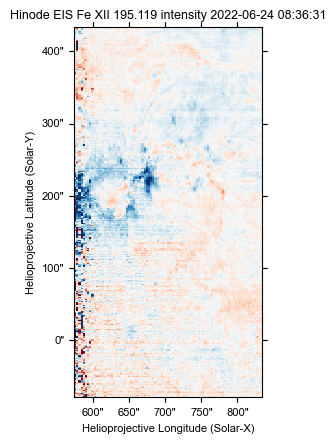

In [417]:
dopp_eis_fe_8.plot(norm = colors.Normalize(vmin=-30, vmax=30), cmap='RdBu_r')

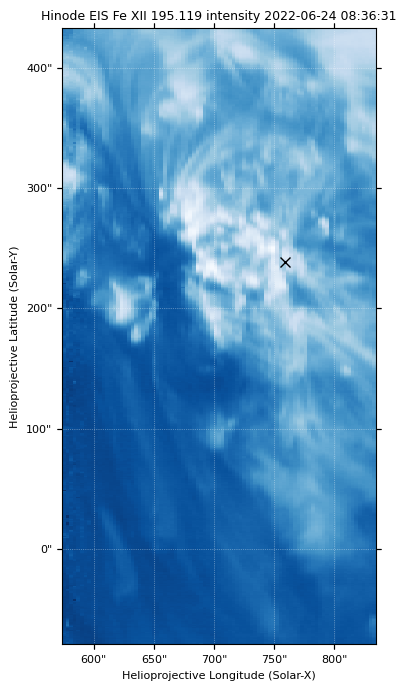

In [39]:
fig = plt.figure(figsize=(24, 8))

ax2 = fig.add_subplot(111, projection=aligned_eis)

aligned_eis.plot(axes=ax2)

hpc_max = SkyCoord(hpc_x*u.arcsec, hpc_y*u.arcsec, frame = aligned_eis.coordinate_frame)
ax2.plot_coord(hpc_max, 'wx', fillstyle='none', markersize=7, color='black')


In [342]:
new_dimensions = [aia_maps[1700].data.shape[1]/2, aia_maps[1700].data.shape[0]/2]*u.pix
aia_resampled_map = aia_maps[1700].resample(new_dimensions)


In [345]:
from sunpy.net import Fido, attrs as a

# Define the time range for the search
time_range = a.Time(time2, time2 + 1*u.minute)

# Search for AIA 304 data
result = Fido.search(time_range, a.Instrument('AIA'), a.Wavelength(304*u.angstrom))[0][0]

# Download the data
downloaded_files = Fido.fetch(result)

# Load the map
aia_304_map = sunpy.map.Map(downloaded_files[0])

# Submap to the same FOV as aia_maps[1700]
aia_304_submap = aia_304_map.submap(aia_maps[1700].bottom_left_coord, top_right=aia_maps[1700].top_right_coord)
# hmi_submap = aia_maps['hmi'].submap(aia_maps[1700].bottom_left_coord, top_right=aia_maps[1700].top_right_coord)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia_lev1_304a_2022_06_24t08_58_05_13z_image_lev1.fits:   0%|          | 0.00/7.39M [00:00<?, ?B/s]

In [359]:
dem_results.shape

(852, 430, 40)

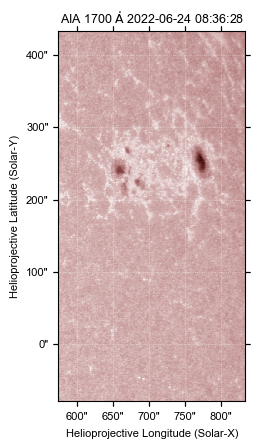

In [370]:
aia_maps[1700].plot()

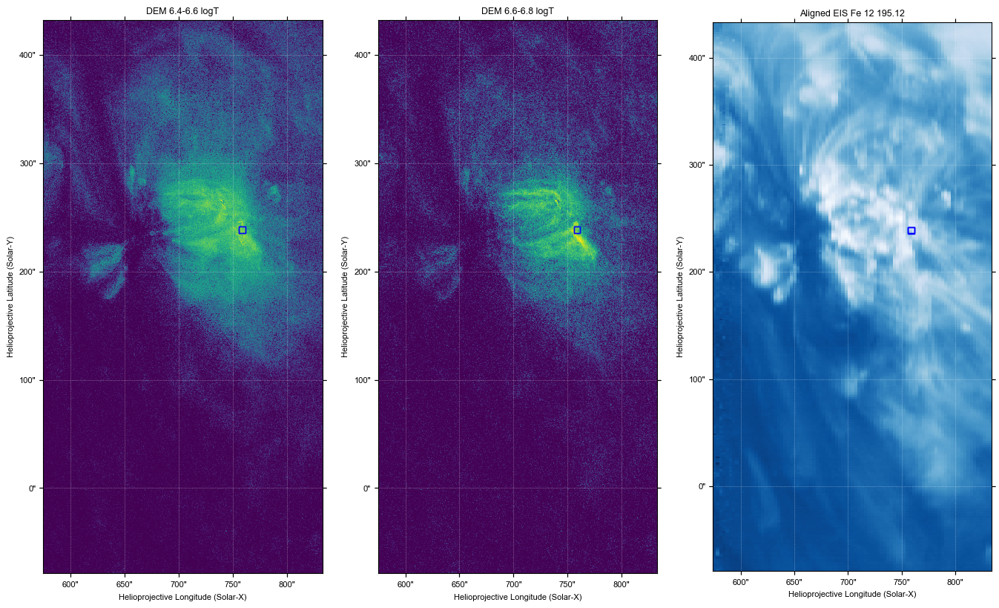

In [392]:
coords = SkyCoord(Tx=(hpc_max.Tx.value - 3, hpc_max.Tx.value + 3) * u.arcsec, Ty=(hpc_max.Ty.value - 3, hpc_max.Ty.value + 3) * u.arcsec,frame=aia_maps[1700].coordinate_frame)
coords_eis = SkyCoord(Tx=(hpc_max.Tx.value - 3, hpc_max.Tx.value + 3) * u.arcsec, Ty=(hpc_max.Ty.value - 3, hpc_max.Ty.value + 3) * u.arcsec,frame=aligned_eis.coordinate_frame)

# Extract the DEM results and bins from the results list
dem_results = results[0]
dem_bins = results[5]

# Define the specific DEM bins to plot
plot_bins = [(6.4, 6.6), (6.6, 6.8)]

# Create a figure to plot the DEM results
fig = plt.figure(figsize=(15*1.1, 10))
ax1 = fig.add_subplot(131, projection=aia_maps[1700])
ax2 = fig.add_subplot(132, projection=aia_maps[1700])
ax3 = fig.add_subplot(133, projection=aligned_eis)
# Loop through the DEM bins and plot the results
for i, (dem_min, dem_max) in enumerate(plot_bins):
    # Find the indices of the bins that match the current range
    bin_indices = (dem_bins >= dem_min) & (dem_bins < dem_max)
    
    # Extract the DEM data for the current bin
    dem_data = dem_results[:,:,bin_indices].sum(axis=2)
    
    # Create a SunPy map for the DEM data
    dem_map = sunpy.map.Map(dem_data, aia_maps[1700].meta)
    
    # Plot the DEM map
    dem_map.plot(axes=[ax1, ax2, ax3][i], cmap='viridis')
    [ax1, ax2, ax3][i].set_title(f'DEM {dem_min}-{dem_max} logT')
    for ax in [ax1, ax2, ax3]:
        # ax.plot_coord(hpc_max, 'wx', fillstyle='none', markersize=10, color='black')

        aia_maps[1700].draw_quadrangle(coords, axes=ax, edgecolor="blue")

# Plot aligned_eis with the box
aligned_eis.plot(axes=ax3, cmap='Blues_r')
ax3.set_title('Aligned EIS Fe 12 195.12')
aligned_eis.draw_quadrangle(coords_eis, axes=ax3, edgecolor="blue")


Footpoint Test with AIA and EIS
- Little shows in AIA

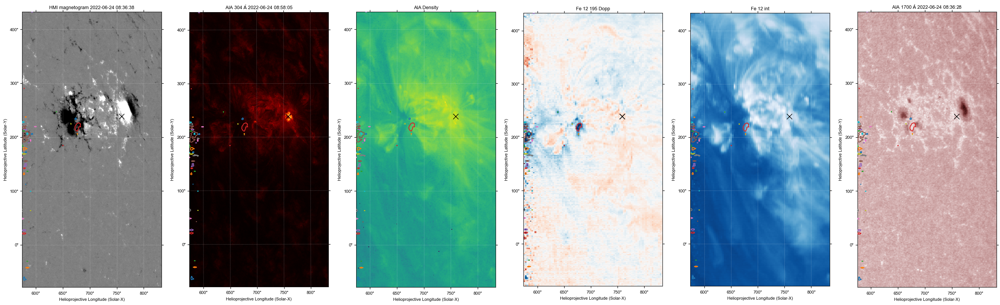

In [356]:
fig = plt.figure(figsize=(30*1.1, 10))
ax1 = fig.add_subplot(161, projection=aia_maps['hmi'])
ax2 = fig.add_subplot(162, projection=aia_304_submap)
ax3 = fig.add_subplot(163, projection=aia_resampled_map)
ax4 = fig.add_subplot(164, projection=dopp_eis)
ax5 = fig.add_subplot(165, projection=aligned_eis)
ax6 = fig.add_subplot(166, projection=aia_maps[1700])

# ax2.pcolormesh(density)
# ax2.set_title('peak density')
aia_maps['hmi'].plot(axes=ax1, norm = colors.Normalize(vmin=-400, vmax=400))
aia_304_submap.plot(axes=ax2)
diff = density - init_density

aia_density_map = sunpy.map.Map(density, aia_resampled_map.meta)
aia_density_map.plot(axes=ax3, cmap='viridis')
# ax3.pcolormesh(diff, vmin=np.min(diff)*1.5,vmax=np.max(diff)*0.5)
ax3.set_title('AIA Density')

# aia_maps[304].plot(axes=ax6)
# Use sunpy plot for Doppler map
dopp_eis.plot(axes=ax4, norm = colors.Normalize(vmin=-30, vmax=30), cmap='RdBu_r')
ax4.set_title('Fe 12 195 Dopp')
ax4.plot_coord(hpc_max, 'wx', fillstyle='none', markersize=10, color='black')

contours = dopp_eis.contour(-20 * dopp_eis.unit)
aligned_eis.plot(axes=ax5, cmap='Blues_r')


ax5.set_title('Fe 12 int')

aia_maps[1700].plot(axes=ax6)

contour_axes = [ax1, ax2, ax3, ax4, ax5, ax6]
for ax in contour_axes:
    ax.plot_coord(hpc_max, 'wx', fillstyle='none', markersize=10, color='black')

    for contour in contours:
        ax.plot_coord(contour)


In [421]:
world_coord

<SkyCoord (Helioprojective: obstime=2022-06-24T08:36:31.500, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2022-06-24T08:36:31.500, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (5.91458019e-15, 2.08733317, 1.52055146e+11)>): (Tx, Ty) in arcsec
    (677.3504353, 219.59937464)>

In [738]:
import numpy as np
from scipy import ndimage
from skimage import filters, morphology

def find_largest_upflow_region(dopp_eis):
    # Extract data from the EIS map
    data = dopp_eis.data
    
    # Pre-processing: Remove positive velocities and extreme negative velocities
    data = np.where(data > 0, 0, data)
    data = np.where(data < -55, 0, data)
    
    # Smoothing: Apply Gaussian filter to reduce noise
    smoothed_data = ndimage.gaussian_filter(data, sigma=1.5, mode='nearest')
    
    # Further noise reduction: Apply median filter
    median_filtered = filters.median(smoothed_data, morphology.disk(3))
    
    # Create binary mask for upflow regions
    upflow_mask = (median_filtered < -10)
    
    # Clean up the mask: Remove small objects and close gaps
    cleaned = morphology.remove_small_objects(upflow_mask, min_size=40)
    cleaned = morphology.closing(cleaned, morphology.disk(3))
    
    # Label connected regions in the cleaned mask
    labeled_mask, num_features = ndimage.label(cleaned)
    
    if num_features > 0:
        # Find the largest connected region
        sizes = ndimage.sum(cleaned, labeled_mask, range(1, num_features + 1))
        largest_feature_label = sizes.argmax() + 1
        largest_feature_mask = labeled_mask == largest_feature_label
        
        # Get the bounding box of the largest region
        y, x = np.where(largest_feature_mask)
        bottom_left_y, bottom_left_x = np.min(y), np.min(x)
        top_right_y, top_right_x = np.max(y), np.max(x)
        
        # Calculate spans
        x_span = top_right_x - bottom_left_x
        y_span = top_right_y - bottom_left_y
        
        # Define shrink factor function
        def get_shrink_factor(span):
            if span <= 8:
                return 1.0  # No shrinking for small spans
            elif span <= 15:
                return 0.9  # 10% shrink for medium spans
            else:
                return max(0.5, 0.8 - (span - 15) * 0.01)  # More aggressive shrinking for larger spans, minimum 50%
        
        # Calculate shrink factors
        shrink_factor_x = get_shrink_factor(x_span)
        shrink_factor_y = get_shrink_factor(y_span)
        
        # Calculate center points
        center_x = (bottom_left_x + top_right_x) / 2
        center_y = (bottom_left_y + top_right_y) / 2
        
        # Apply shrinking
        new_x_span = x_span * shrink_factor_x
        new_y_span = y_span * shrink_factor_y
        
        # Calculate new bounding box
        bottom_left_x = int(center_x - new_x_span / 2)
        bottom_left_y = int(center_y - new_y_span / 2)
        top_right_x = int(center_x + new_x_span / 2)
        top_right_y = int(center_y + new_y_span / 2)
        
        # Convert pixel coordinates to world coordinates
        bottom_left_world = dopp_eis.pixel_to_world((bottom_left_x) * u.pix, (bottom_left_y) * u.pix)
        top_right_world = dopp_eis.pixel_to_world((top_right_x) * u.pix, (top_right_y) * u.pix)
        
        return bottom_left_world, top_right_world
    else:
        print("No significant upflow region found.")
        return None, None

# Example usage:
# bottom_left_world, top_right_world = find_largest_upflow_region(dopp_eis)
# if bottom_left_world and top_right_world:
#     print(f"World coordinates of the bottom left: {bottom_left_world}")
#     print(f"World coordinates of the top right: {top_right_world}")
# else:
#     print("No significant upflow region found.")

In [744]:
bottom_left_world, top_right_world = find_largest_upflow_region(dopp_eis)

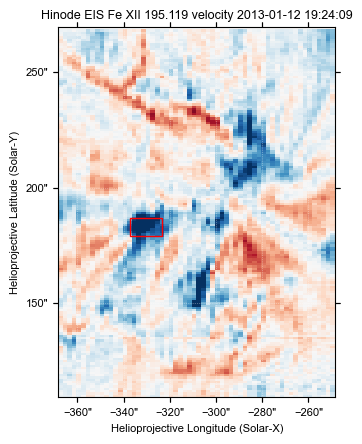

In [745]:
from matplotlib.patches import Rectangle

# Create a new figure with WCS projection
fig = plt.figure()
ax = fig.add_subplot(111, projection=dopp_eis)

# Plot the bottom left and top right coordinates as a rectangle on the dopp_eis map
dopp_eis.plot(axes=ax, norm=colors.Normalize(vmin=-15, vmax=15), cmap='RdBu_r')
coords = SkyCoord(Tx=(bottom_left_world.Tx.value, top_right_world.Tx.value) * u.arcsec, Ty=(bottom_left_world.Ty.value, top_right_world.Ty.value) * u.arcsec, frame=dopp_eis.coordinate_frame)

dopp_eis.draw_quadrangle(coords, axes=ax, edgecolor="red")

plt.show()


In [667]:
bottom_left_world, top_right_world

(None, None)

In [742]:
import eispac.download

csv_path = '/Users/andysh.to/Downloads/EIS Flares Project/downloaded_flare_data.csv'
df = pd.read_csv(csv_path)

# Find the correct filename for '2012_05_14_102651'
target_date = '2013_01_12_190820'
matching_filename = df[df['filename'].str.contains(target_date.replace('_', '', 2))]['filename'].values
downloaded_file = eispac.download.download_hdf5_data(matching_filename[0])


 + data_eis/eis_20130112_190820.data.h5 exists, skipping download
 + data_eis/eis_20130112_190820.head.h5 exists, skipping download


data_eis/eis_20130112_190820.fe_12_195_119.2c-0.fit.h5
Reading fit result from, 
   data_eis/eis_20130112_190820.fe_12_195_119.2c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


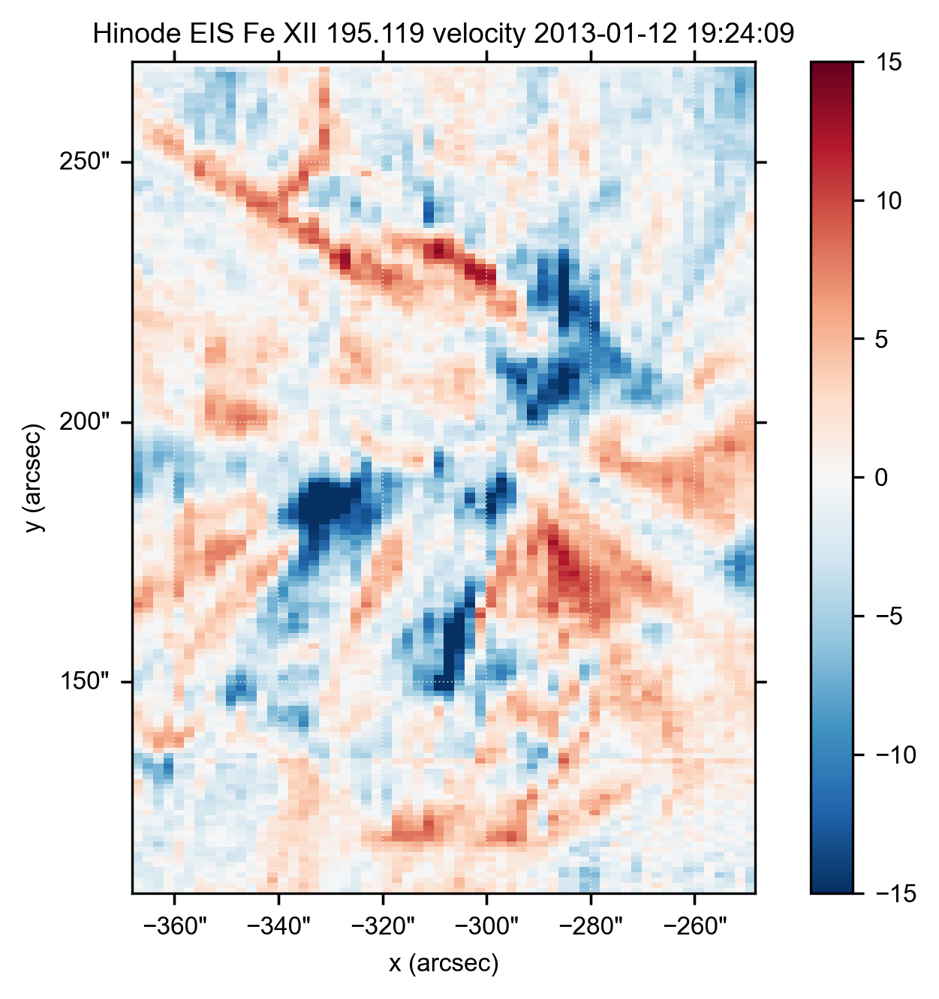

In [743]:

# asheis_file = asheis('data_eis/'+'eis_20120514_102651.data.h5')
asheis_file = asheis('data_eis/'+matching_filename[0])
dopp_eis = asheis_file.get_velocity('fe_12_195.12', plot=True, vmin=-15,vmax=15)


In [ ]:

bottom_left_world, top_right_world = find_largest_upflow_region(dopp_eis)

In [459]:
filename = 'eis_20110127_095540.data.h5'
time = filename.split('_')[2][:6]
time

'095540'

### Check upflow identification box

In [1]:
import pandas as pd
import requests
from pathlib import Path
import matplotlib.pyplot as plt
from sunpy.map import Map
from astropy.coordinates import SkyCoord
import astropy.units as u
import os
from tqdm import tqdm
import glob
import sys
from IPython.display import clear_output

# Read the CSV file
csv_path = '/Users/andysh.to/Downloads/EIS Flares Project/downloaded_flare_data.csv'
df = pd.read_csv(csv_path)

# Function to download file with progress bar
def download_file(url, save_path):
    max_retries = 10
    retry_delay = 10  # seconds
    
    for attempt in range(max_retries):
        try:
            response = requests.get(url, stream=True)
            response.raise_for_status()
            
            total_size = int(response.headers.get('content-length', 0))
            block_size = 1024  # 1 KB
            
            with open(save_path, 'wb') as f, tqdm(
                desc=save_path.name,
                total=total_size,
                unit='iB',
                unit_scale=True,
                unit_divisor=1024,
            ) as progress_bar:
                for data in response.iter_content(block_size):
                    size = f.write(data)
                    progress_bar.update(size)
            
            print(f"Downloaded: {save_path}")
            return  # Success, exit the function
        
        except requests.exceptions.HTTPError as e:
            if e.response.status_code == 404:
                print(f"File not found (404 error): {url}")
                return None  # Skip this file
            elif attempt < max_retries - 1:
                print(f"Error occurred: {str(e)}. Retrying in {retry_delay} seconds...")
                import time
                time.sleep(retry_delay)
            else:
                print(f"Failed to download after {max_retries} attempts: {url}")
                print(f"Error: {str(e)}")
                return None  # Skip this file after max retries
        
        except (requests.exceptions.RequestException, OSError) as e:
            if attempt < max_retries - 1:
                print(f"Error occurred: {str(e)}. Retrying in {retry_delay} seconds...")
                import time
                time.sleep(retry_delay)
            else:
                print(f"Failed to download after {max_retries} attempts: {url}")
                print(f"Error: {str(e)}")
                return None  # Skip this file after max retries

# Process each entry in the CSV
for index, row in df.iterrows():    
    # Clear output
    clear_output(wait=True)
    
    # Construct file names using the filename entry
    data_file = row['filename']
    year = data_file[4:8]
    month = data_file[8:10]
    date = data_file[10:12]
    time = data_file.split('_')[2][:6]

    # Check if the plot already exists
    download_dir = Path('/Users/andysh.to/Downloads/EIS_Data')
    plot_path = download_dir / f"doppler_velocity_map_{year}_{month}_{date}_{time}.png"
    no_upflow_plot_path = download_dir / f"no_upflow_doppler_velocity_map_{year}_{month}_{date}_{time}.png"
    dopp_map_path = download_dir / f"doppler_velocity_map_{year}_{month}_{date}_{time}.fits"
    intensity_map_path = download_dir / f"intensity_map_{year}_{month}_{date}_{time}.fits"
    
    if plot_path.exists() or no_upflow_plot_path.exists() or dopp_map_path.exists() or intensity_map_path.exists():
        print(f"Plot, Doppler map, or Intensity map already exists for {year}-{month}-{date} {time}. Skipping...")
        continue

    head_file = data_file.replace('.data.h5', '.head.h5')
    
    # Construct URLs
    base_url = f"https://vsolar.mssl.ucl.ac.uk/eispac/hdf5/{year}/{month}/{date}/"
    data_url = base_url + data_file
    head_url = base_url + head_file
    
    # Create directory for downloads if it doesn't exist
    download_dir.mkdir(parents=True, exist_ok=True)
    
    # Download files
    data_path = download_dir / data_file
    head_path = download_dir / head_file
    print(f"Downloading files for {year}-{month}-{date} {time}")
    data_file_downloaded = download_file(data_url, data_path)
    head_file_downloaded = download_file(head_url, head_path)
    
    # If either file failed to download, skip this iteration
    if data_file_downloaded is None or head_file_downloaded is None:
        print(f"Skipping processing for {year}-{month}-{date} {time} due to download failure")
        continue
    
    try:
        # Process the downloaded files
        print(f"Processing files for {year}-{month}-{date} {time}")
        eis_map = asheis(data_path)
        
        # Get Doppler velocity
        dopp_eis = eis_map.get_velocity('fe_12_195.12', plot=False)
        
        # Save the Doppler velocity map
        dopp_eis.save(dopp_map_path)
        print(f"Doppler velocity map saved: {dopp_map_path}")
        
        # Get and save the intensity map
        intensity_eis = eis_map.get_intensity('fe_12_195.12', plot=False)
        intensity_eis.save(intensity_map_path)
        print(f"Intensity map saved: {intensity_map_path}")
        
        # Find largest upflow region
        bottom_left_world, top_right_world = find_largest_upflow_region(dopp_eis)
        
        # Create a new figure with WCS projection
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection=dopp_eis)
        
        # Plot the Doppler velocity map
        im = dopp_eis.plot(axes=ax, norm=plt.Normalize(vmin=-15, vmax=15), cmap='RdBu_r')
        
        if bottom_left_world and top_right_world:
            # Plot the largest upflow region
            coords = SkyCoord(Tx=(bottom_left_world.Tx.value, top_right_world.Tx.value) * u.arcsec, 
                              Ty=(bottom_left_world.Ty.value, top_right_world.Ty.value) * u.arcsec, 
                              frame=dopp_eis.coordinate_frame)
            
            dopp_eis.draw_quadrangle(coords, axes=ax, edgecolor="red", lw=2)
            
            plot_prefix = ""
        else:
            print(f"No significant upflow region found for {year} {month} {date} {time}")
            plot_prefix = "no_upflow_"
        
        # Add colorbar
        plt.colorbar(im, ax=ax, label='Doppler Velocity [km/s]')
        
        # Set title
        plt.title(f"Doppler Velocity Map - {year} {month} {date} {time}")
        
        # Save the plot
        plot_path = download_dir / f"{plot_prefix}doppler_velocity_map_{year}_{month}_{date}_{time}.png"
        plt.savefig(plot_path)
        plt.close(fig)
        
        print(f"Plot saved: {plot_path}")
    
    except Exception as e:
        print(f"Error processing {year} {month} {date} {time}: {str(e)}")
    
    finally:
        # Delete the downloaded files and additional .fit.h5 files
        files_to_delete = [
            data_path,
            head_path,
            *glob.glob(str(download_dir / f"eis_{year}{month}{date}_{time}*.fit.h5"))
        ]
        
        for file_path in files_to_delete:
            if os.path.exists(file_path):
                os.remove(file_path)
                print(f"Deleted: {file_path}")


Plot, Doppler map, or Intensity map already exists for 2024-05-12 123013. Skipping...


Traceback (most recent call last):
  File "/Users/andysh.to/miniconda3/envs/solar/lib/python3.11/site-packages/matplotlib/cbook.py", line 298, in process
    func(*args, **kwargs)
  File "/var/folders/6w/c91jbrwd1k501xpqgh_czqbmvjj465/T/ipykernel_90228/1590092911.py", line 171, in on_motion
    if event.inaxes == self.ax3 and self.is_dragging:
                                    ^^^^^^^^^^^^^^^^
AttributeError: 'EISPlotter' object has no attribute 'is_dragging'
Traceback (most recent call last):
  File "/Users/andysh.to/miniconda3/envs/solar/lib/python3.11/site-packages/matplotlib/cbook.py", line 298, in process
    func(*args, **kwargs)
  File "/var/folders/6w/c91jbrwd1k501xpqgh_czqbmvjj465/T/ipykernel_90228/1590092911.py", line 171, in on_motion
    if event.inaxes == self.ax3 and self.is_dragging:
                                    ^^^^^^^^^^^^^^^^
AttributeError: 'EISPlotter' object has no attribute 'is_dragging'
Traceback (most recent call last):
  File "/Users/andysh.to/minicond

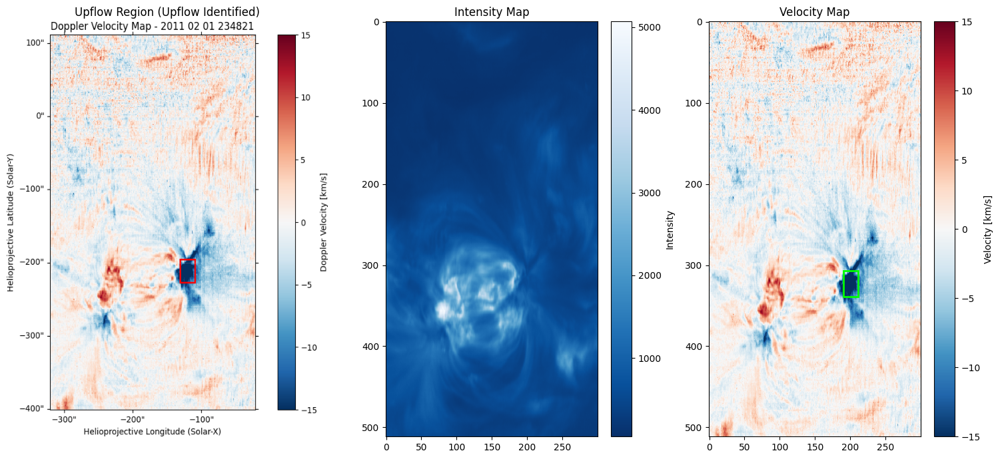

In [10]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import tkinter as tk
from tkinter import filedialog
import astropy.io.fits as fits
import numpy as np
from PIL import Image, ImageTk
import os
import sunpy.map
import matplotlib.colors as colors
import matplotlib.patches as patches
import pandas as pd

def get_pixel_coordinates(dopp_eis, bottom_left_world, top_right_world):
    bottom_left_pixel = dopp_eis.world_to_pixel(bottom_left_world)
    top_right_pixel = dopp_eis.world_to_pixel(top_right_world)
    return bottom_left_pixel, top_right_pixel

class EISPlotter:
    def __init__(self, master):
        self.master = master
        self.master.title("EIS Plotter")
        
        self.data_dir = "/Users/andysh.to/Downloads/EIS_Data"
        self.csv_path = "/Users/andysh.to/Downloads/EIS_Data/upflow_results.csv"
        self.upflow_data = self.read_upflow_csv()
        self.file_combinations = self.get_file_combinations()
        self.current_index = 0
        
        self.setup_gui()
        
    def read_upflow_csv(self):
        df = pd.read_csv(self.csv_path)
        return {row['filename']: (row['bottom_left_x'], row['bottom_left_y'], row['top_right_x'], row['top_right_y']) 
                for _, row in df.iterrows()}
    
    def setup_gui(self):
        self.fig = plt.figure(figsize=(20,7))
        self.ax1 = self.fig.add_subplot(131)
        self.ax2 = self.fig.add_subplot(132)
        self.ax3 = self.fig.add_subplot(133)
        
        self.canvas = FigureCanvasTkAgg(self.fig, master=self.master)
        self.canvas.draw()
        self.canvas.get_tk_widget().pack(fill=tk.BOTH, expand=True)
        
        button_frame = tk.Frame(self.master)
        button_frame.pack()
        
        self.prev_button = tk.Button(button_frame, text="Previous", command=self.prev_image)
        self.prev_button.pack(side=tk.LEFT)
        
        self.next_button = tk.Button(button_frame, text="Next", command=self.next_image)
        self.next_button.pack(side=tk.LEFT)
        
        self.info_label = tk.Label(self.master, text="Click and drag on velocity map to create a box")
        self.info_label.pack()
        
        self.plot_current_image()
        
    def get_file_combinations(self):
        combinations = []
        for file in os.listdir(self.data_dir):
            if file.endswith(".png"):
                base_name = file.replace("no_upflow_doppler_velocity_map_", "").replace("doppler_velocity_map_", "").replace(".png", "")
                intensity_file = f"intensity_map_{base_name}.fits"
                velocity_file = f"doppler_velocity_map_{base_name}.fits"
                if os.path.exists(os.path.join(self.data_dir, intensity_file)) and \
                   os.path.exists(os.path.join(self.data_dir, velocity_file)):
                    combinations.append((file, intensity_file, velocity_file))
        return combinations
    
    def plot_current_image(self):
        png_file, intensity_file, velocity_file = self.file_combinations[self.current_index]
        
        # Clear previous plots and colorbars
        self.fig.clear()
        
        # Plot PNG
        png_image = Image.open(os.path.join(self.data_dir, png_file))
        png_array = np.array(png_image)
        
        # Remove white space and adjust aspect ratio
        non_white = np.any(png_array != 255, axis=-1)
        rows = np.any(non_white, axis=1)
        cols = np.any(non_white, axis=0)
        ymin, ymax = np.where(rows)[0][[0, -1]]
        xmin, xmax = np.where(cols)[0][[0, -1]]
        cropped_png = png_array[ymin:ymax+1, xmin:xmax+1]
        
        aspect_ratio = cropped_png.shape[0] / cropped_png.shape[1]
        
        # Calculate the width ratios based on the aspect ratio of the PNG
        width_ratios = [aspect_ratio, 1, 1]
        total_ratio = sum(width_ratios)
        width_ratios = [r/total_ratio for r in width_ratios]
        
        # Create subplots with adjusted width ratios
        gs = self.fig.add_gridspec(1, 3, width_ratios=width_ratios)
        self.ax1 = self.fig.add_subplot(gs[0, 0])
        self.ax2 = self.fig.add_subplot(gs[0, 1])
        self.ax3 = self.fig.add_subplot(gs[0, 2])
        
        self.ax1.imshow(cropped_png, aspect='auto')
        
        # Set title based on file prefix
        if png_file.startswith("no_upflow_"):
            self.ax1.set_title("Upflow Region (No Upflow Identified)", fontsize=12)
        else:
            self.ax1.set_title("Upflow Region (Upflow Identified)", fontsize=12)
        
        self.ax1.axis('off')
        
        # Plot Intensity Map
        with fits.open(os.path.join(self.data_dir, intensity_file)) as hdul:
            intensity_data = hdul[0].data
        im2 = self.ax2.imshow(np.flipud(intensity_data), cmap='Blues_r', aspect='auto')
        self.ax2.set_title("Intensity Map")
        self.fig.colorbar(im2, ax=self.ax2, label='Intensity')
        
        # Plot Velocity Map
        with fits.open(os.path.join(self.data_dir, velocity_file)) as hdul:
            self.velocity_data = hdul[0].data
        self.im3 = self.ax3.imshow(np.flipud(self.velocity_data), cmap='RdBu_r', norm=colors.Normalize(vmin=-15, vmax=15), aspect='auto')
        self.ax3.set_title("Velocity Map")
        self.fig.colorbar(self.im3, ax=self.ax3, label='Velocity [km/s]')
        # Plot pre-identified upflow region if it exists
        filename = os.path.basename(velocity_file)
        # Extract date and time from the filename
        date_time = filename.replace('doppler_velocity_map_', '').replace('.fits', '')
        year, month, day, time = date_time.split('_')
        # Reconstruct the filename in the desired format
        filename = f"eis_{year}{month}{day}_{time}.data.h5"
        if filename in self.upflow_data:
            bottom_left_x, bottom_left_y, top_right_x, top_right_y = self.upflow_data[filename]
            if bottom_left_x != 0 or bottom_left_y != 0 or top_right_x != 0 or top_right_y != 0:  # Check if upflow was identified
                width = bottom_left_x - top_right_x
                height = bottom_left_y - top_right_y
                # Flip the y-coordinates vertically
                flipped_top_right_y = self.velocity_data.shape[0] - top_right_y
                flipped_bottom_left_y = self.velocity_data.shape[0] - bottom_left_y
                rect = patches.Rectangle((top_right_x, flipped_top_right_y), width, -height,
                                         fill=False, edgecolor='lime', linewidth=2)
                self.ax3.add_patch(rect)
        self.fig.tight_layout()
        self.canvas.draw()
        
        self.canvas.mpl_connect('button_press_event', self.on_press)
        self.canvas.mpl_connect('button_release_event', self.on_release)
        self.canvas.mpl_connect('motion_notify_event', self.on_motion)
        
    def next_image(self):
        self.current_index = (self.current_index + 1) % len(self.file_combinations)
        self.plot_current_image()
        
    def prev_image(self):
        self.current_index = (self.current_index - 1) % len(self.file_combinations)
        self.plot_current_image()
        
    def on_press(self, event):
        if event.inaxes == self.ax3:
            self.start_x = event.xdata
            self.start_y = event.ydata
            self.is_dragging = True
            if hasattr(self, 'rect') and self.rect:
                self.rect.remove()
                self.rect = None
            self.canvas.draw()
    
    def on_motion(self, event):
        if event.inaxes == self.ax3 and self.is_dragging:
            if hasattr(self, 'rect') and self.rect:
                self.rect.remove()
            end_x, end_y = event.xdata, event.ydata
            width = end_x - self.start_x
            height = end_y - self.start_y
            self.rect = patches.Rectangle((self.start_x, self.start_y), 
                                          width, height, 
                                          fill=False, edgecolor='red', linewidth=2)
            self.ax3.add_patch(self.rect)
            self.canvas.draw()
    
    def on_release(self, event):
        if event.inaxes == self.ax3 and self.is_dragging:
            self.is_dragging = False
            end_x, end_y = event.xdata, event.ydata
            
            # Ensure start coordinates are smaller than end coordinates
            x_min, x_max = min(self.start_x, end_x), max(self.start_x, end_x)
            y_min, y_max = min(self.start_y, end_y), max(self.start_y, end_y)
            
            # Convert to integer coordinates
            x_min, x_max = int(x_min), int(x_max)
            y_min, y_max = int(y_min), int(y_max)
            
            # Ensure coordinates are within the image bounds
            x_min = max(0, x_min)
            x_max = min(self.velocity_data.shape[1] - 1, x_max)
            y_min = max(0, y_min)
            y_max = min(self.velocity_data.shape[0] - 1, y_max)
            
            # Flip y-coordinates
            y_min, y_max = self.velocity_data.shape[0] - 1 - y_max, self.velocity_data.shape[0] - 1 - y_min
            
            # Get bottom left and top right coordinates
            bottom_left = f"({x_min}, {y_min})"
            top_right = f"({x_max}, {y_max})"
            
            # Calculate average velocity in the box
            box_velocities = self.velocity_data[y_min:y_max+1, x_min:x_max+1]
            avg_velocity = np.mean(box_velocities)
            
            info_text = (f"Box Coordinates:\n"
                         f"Bottom Left: {bottom_left}, Top Right: {top_right}\n"
                         f"Average Velocity in Box: {avg_velocity:.2f} km/s")
            
            self.info_label.config(text=info_text)
            
            # Update or create the rectangle
            if hasattr(self, 'rect') and self.rect:
                self.rect.remove()
            self.rect = patches.Rectangle((x_min, self.velocity_data.shape[0] - 1 - y_max), 
                                          x_max - x_min, y_max - y_min,
                                          fill=False, edgecolor='red', linewidth=2)
            self.ax3.add_patch(self.rect)
            self.canvas.draw()
    
    def stop_process(self):
        plt.close('all')  # Close all matplotlib figures
        self.master.quit()  # Quit the mainloop
        self.master.destroy()  # Destroy the Tkinter window

root = tk.Tk()
plotter = EISPlotter(root)
root.mainloop()


In [27]:
from netCDF4 import Dataset

# Path to your NetCDF file
file_path = '/Users/andysh.to/Downloads/sci_xrsf-l2-bkd1d_g15_s20100331_e20200304_v1-0-0.nc'

# Open the NetCDF file
with Dataset(file_path, 'r') as nc:
    
    # Print the file format
    print(f"File format: {nc.file_format}")
    
    # Print global attributes
    print("\nGlobal Attributes:")
    for attr in nc.ncattrs():
        print(f"{attr}: {getattr(nc, attr)}")
    
    # Print dimensions
    print("\nDimensions:")
    for dim in nc.dimensions.values():
        print(f"{dim.name}: {dim.size}")
    
    # Print variables
    print("\nVariables:")
    for var in nc.variables.values():
        print(f"{var.name}: {var.dimensions} {var.dtype}")
        
        # Print variable attributes
        for attr in var.ncattrs():
            print(f"    {attr}: {getattr(var, attr)}")
        
        # Print a few data values (first 5)
        print(f"    First 5 values: {var[:5]}")
        print()


File format: NETCDF4

Global Attributes:
Conventions: ACDD-1.3, Spase v2.2.6
title: L2 XRS 1 day background
summary: The EXIS X-Ray Sensor (XRS) measures in a short wavelength channel (XRS-A) between 0.05 and 0.4 nm and in a longer wavelength channel (XRS-B) between 0.1 and 0.8 nm. This product consists of 1 background value per day for the XRS-B channel derived from the 1 minute average  solar measurements. The background is obtained by first creating hourly averages. Then for each of 3 8-h blocks, the minimum hourly average is found. The background is the lower of either the middle block or the average of the first and third block.
keywords: NumericalData.ObservedRegion.Earth.Magnetosphere, NumericalData.MeasurementType.Irradiance
keywords_vocabulary: SPASE: Space Physics Archive Search and Extract Data Model version 2.2.6, GCMD: NASA Global Change Master Directory (GCMD) Earth Science Keywords version 8.5
naming_authority: gov.nesdis.noaa
history: See algorithm information.
source: 

In [28]:
from netCDF4 import Dataset
import numpy as np

# Open the NetCDF file
file_path = '/Users/andysh.to/Downloads/sci_xrsf-l2-bkd1d_g15_s20100331_e20200304_v1-0-0.nc'
nc_file = Dataset(file_path, 'r')

# Access the avg1d_xrsa_flux variable
avg1d_xrsa_flux = nc_file.variables['avg1d_xrsa_flux'][:]
avg1d_xrsb_flux = nc_file.variables['avg1d_xrsb_flux'][:]
time = nc_file.variables['time'][:]

# Get the fill value
fill_value = nc_file.variables['avg1d_xrsa_flux']._FillValue

# Replace fill values with NaN for easier handling
avg1d_xrsa_flux = np.where(avg1d_xrsa_flux == fill_value, np.nan, avg1d_xrsa_flux)
avg1d_xrsb_flux = np.where(avg1d_xrsb_flux == fill_value, np.nan, avg1d_xrsb_flux)
# Print some basic information
print("Shape of avg1d_xrsa_flux:", avg1d_xrsa_flux.shape)
print("First 5 non-NaN values:", avg1d_xrsa_flux[~np.isnan(avg1d_xrsa_flux)][:5])

# Access other metadata
print("Units:", nc_file.variables['avg1d_xrsa_flux'].units)
print("Long name:", nc_file.variables['avg1d_xrsa_flux'].long_name)

# Close the file when done
nc_file.close()


Shape of avg1d_xrsa_flux: (3426,)
First 5 non-NaN values: [-9999. -9999. -9999. -9999. -9999.]
Units: W/m2
Long name: Daily average flux for XRS-A.


In [39]:
from datetime import datetime

start_date = datetime(2010, 3, 31)
end_date = datetime(2020, 3, 4)
days_difference = (end_date - start_date).days

print(f"The number of days between 20100331 and 20200304 is: {days_difference}")

The number of days between 20100331 and 20200304 is: 3626


In [50]:
# Calculate 20 years in seconds
twenty_years_seconds = 30 * 365.25 * 24 * 60 * 60  # Accounting for leap years

# Convert to Unix timestamp
twenty_years_unix = int(twenty_years_seconds)

print(f"20 years in Unix timestamp format: {twenty_years_unix} seconds")

# For reference, let's also show this in a more human-readable format
from datetime import datetime, timedelta

current_date = datetime.now()
future_date = current_date + timedelta(seconds=twenty_years_unix)

print(f"Current date: {current_date}")
print(f"Date 20 years from now: {future_date}")
print(f"Difference: {future_date - current_date}")


20 years in Unix timestamp format: 946728000 seconds
Current date: 2024-08-29 13:53:06.494786
Date 20 years from now: 2054-08-30 01:53:06.494786
Difference: 10957 days, 12:00:00


In [54]:
from astropy.time import Time

unix_timestamp = time[-1]+946728000
datetime_2010 = Time(unix_timestamp, format='unix', scale='utc').datetime

print(f"The first timestamp converted to 2010 date format: {datetime_2010.strftime('%Y-%m-%d %H:%M:%S')}")

The first timestamp converted to 2010 date format: 2020-03-04 00:00:00


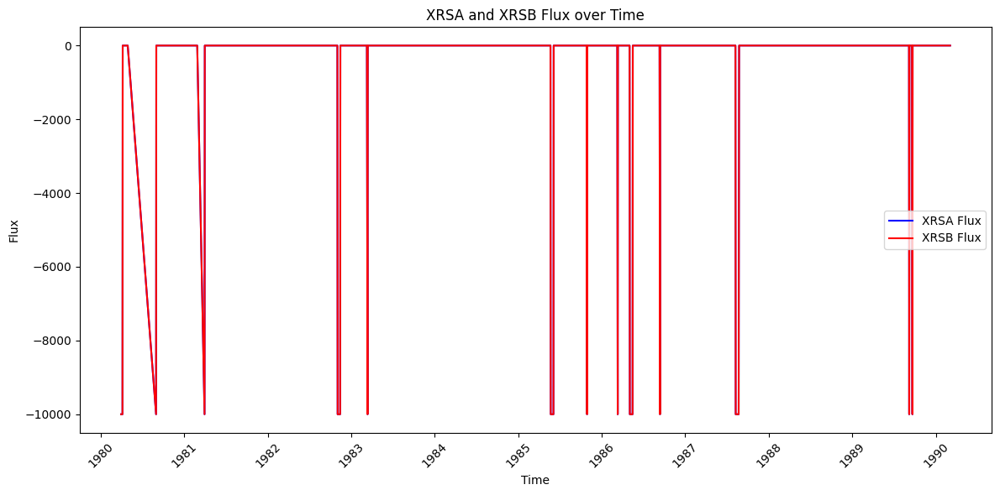

In [33]:
import matplotlib.pyplot as plt
from astropy.time import Time

# Convert time to datetime
time_datetime = Time(time, format='unix', scale='utc').datetime

# Create the plot
plt.figure(figsize=(12, 6))

# Plot avg1d_xrsa_flux
plt.plot(time_datetime, avg1d_xrsa_flux, label='XRSA Flux', color='blue')

# Plot avg1d_xrsb_flux
plt.plot(time_datetime, avg1d_xrsb_flux, label='XRSB Flux', color='red')

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Flux')
plt.title('XRSA and XRSB Flux over Time')

# Add legend
plt.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()


In [26]:
time.shape

(3426,)

In [19]:
avg1d_xrsa_flux

array([-9.9990000e+03, -9.9990000e+03, -9.9990000e+03, ...,
        1.1456056e-09,  1.1646837e-09,  1.3296939e-09], dtype=float32)

In [2]:
import sunpy
import matplotlib
import numpy
import scipy
import astropy

In [11]:
print(scipy.__citation__)

AttributeError: Module 'scipy' has no attribute '__citation__'

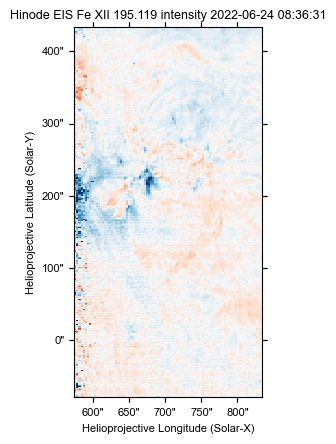

In [394]:

dopp_eis.plot(norm = colors.Normalize(vmin=-30, vmax=30), cmap='RdBu_r')

AIA maps have been loaded from ./data_aia/aia_prepped_20220624_084900.pickle
Submap coordinates calculated with 10% buffer.
All maps have been submap'ed to the same region.
Map for 335A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_335A.fits
Map for 1700A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_1700A.fits
Map for 193A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_193A.fits
Map for 131A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_131A.fits
Map for 171A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_171A.fits
Map for 211A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_211A.fits
Map for 94A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_94A.fits
Map for hmiA saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_hmiA.fits
All AIA map

Calculating DEM: 100%|██████████| 91590/91590 [02:53<00:00, 527.21pixel/s, Pixel=(425,214), Chi^2=0.94] 


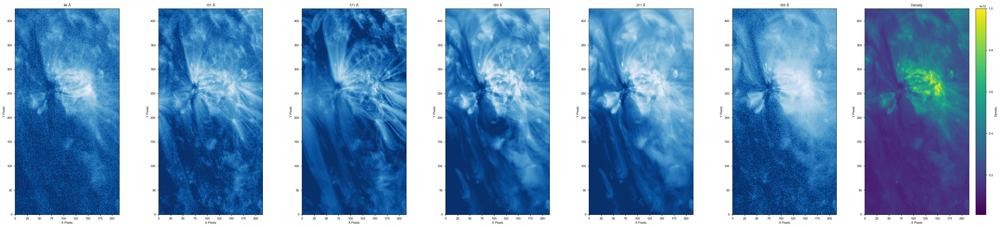

In [235]:

from aia_dem_prep import *
from aiapy.calibrate import estimate_error
from aia_dem import DEMCalculator

def dem_density_calc(aligned_eis, map_date, time):
    image_array, error_array, saved_aia_maps=get_aia_dem_prep(aligned_eis, save_dir, rebin_factor=2, map_date=time1)
    calculator = DEMCalculator()

    pre_results = calculator.calculate_dem(image_array,error_array)
    init_density = calculate_density(pre_results)

    plot_dem_images(aligned_eis,pre_results[0],pre_results[6],'./dem_images_{map_date.value}.png')
    plot_image_array_and_density(image_array, init_density)
    return init_density, pre_results


Downloading and prepping AIA maps

In [229]:
width_buffer = np.abs(aligned_eis.top_right_coord.Tx - aligned_eis.bottom_left_coord.Tx)*0.1
aligned_eis.bottom_left_coord.Tx - width_buffer


<Angle 549.4642155 arcsec>

In [119]:
aia_maps = get_prepped_aia_maps(aligned_eis.date)

Files Downloaded:   0%|          | 0/7 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 171.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!
Prepping...
PSF dictionary found for wavelength 211.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!
Prepping...
PSF dictionary found for wavelength 94.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!
Prepping...
PSF dictionary found for wavelength 335.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!
Prepping...
Prepped!
Prepping...
PSF dictionary found for wavelength 193.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!
Prepping...
PSF dictionary found for wavelength 131.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
Prepped!
AIA maps have been saved to ./data_aia/aia_prepped_20220624_083631.pickle


In [139]:
from aia_dem_prep import *
from aiapy.calibrate import estimate_error
from aia_dem import DEMCalculator

In [124]:
bottom_left = SkyCoord(
    aligned_eis.bottom_left_coord.Tx,
    aligned_eis.bottom_left_coord.Ty,
    frame=aligned_eis.coordinate_frame
)

top_right = SkyCoord(
    aligned_eis.top_right_coord.Tx,
    aligned_eis.top_right_coord.Ty,
    frame=aligned_eis.coordinate_frame
)

# Debug prints to check for NaN values
print(f"Bottom left: {bottom_left}")
print(f"Top right: {top_right}")

# Create submaps for all AIA maps
for wavelength in aia_maps.keys():
    print(wavelength)
    if np.isnan(bottom_left.Tx.value) or np.isnan(bottom_left.Ty.value) or np.isnan(top_right.Tx.value) or np.isnan(top_right.Ty.value):
        print(f"NaN detected in coordinates for wavelength {wavelength}")
        continue
    aia_maps[wavelength] = aia_maps[wavelength].submap(bottom_left, top_right=top_right)

print("All maps have been submap'ed to the same region.")

Bottom left: <SkyCoord (Helioprojective: obstime=2022-06-24T08:36:31.500, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2022-06-24T08:36:31.500, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (5.91458019e-15, 2.08733317, 1.52055146e+11)>): (Tx, Ty) in arcsec
    (575.22289902, -78.41009982)>
Top right: <SkyCoord (Helioprojective: obstime=2022-06-24T08:36:31.500, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2022-06-24T08:36:31.500, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (5.91458019e-15, 2.08733317, 1.52055146e+11)>): (Tx, Ty) in arcsec
    (832.80973415, 432.58851744)>
171
211
94
335
1700
193
131
hmi
All maps have been submap'ed to the same region.


In [137]:
save_dir = '/Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/'
save_aia_maps(aia_maps, save_dir)
saved_aia_maps = read_saved_aia_maps(save_dir)
image_array, error_array = prepare_aia_data(saved_aia_maps)


Map for 171A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_171A.fits
Map for 211A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_211A.fits
Map for 94A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_94A.fits
Map for 335A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_335A.fits
Map for 1700A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_1700A.fits
Map for 193A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_193A.fits
Map for 131A saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_131A.fits
Map for hmiA saved to /Users/andysh.to/Script/Python_Script/eis_flare_list/data_aia/aia_map_hmiA.fits
All AIA maps have been saved.
All saved AIA maps have been read.


In [142]:
calculator = DEMCalculator()

results = calculator.calculate_dem(image_array,error_array)

Calculating DEM: 100%|██████████| 366360/366360 [11:23<00:00, 536.08pixel/s, Pixel=(851,429), Chi^2=0.97]  


In [215]:
aligned_eis.date.value

'2022-06-24T08:36:31.500'

In [145]:
plot_dem_images(aligned_eis,results[0],results[6],'./dem_images.png')

In [146]:
def rebin_array(array, factor):
    """
    Rebin a 3D array by a given factor.

    Parameters:
    array (numpy.ndarray): The input 3D array to be rebinned.
    factor (int): The rebinning factor.

    Returns:
    numpy.ndarray: The rebinned 3D array.
    """
    shape = (array.shape[0] // factor, factor,
             array.shape[1] // factor, factor,
             array.shape[2])
    return array.reshape(shape).mean(axis=(1, 3))

# Rebin image_array and error_array by a factor of 2
rebin_factor = 2
rebinned_image_array = rebin_array(image_array, rebin_factor)
rebinned_error_array = rebin_array(error_array, rebin_factor)



In [150]:
rebinned_results = calculator.calculate_dem(rebinned_image_array,rebinned_error_array)

Calculating DEM: 100%|██████████| 91590/91590 [02:52<00:00, 530.94pixel/s, Pixel=(425,214), Chi^2=1.02]  


In [154]:
rebinned_results[0].shape

(426, 215, 40)

In [157]:
rebinned_results[6]

array([5.625, 5.675, 5.725, 5.775, 5.825, 5.875, 5.925, 5.975, 6.025,
       6.075, 6.125, 6.175, 6.225, 6.275, 6.325, 6.375, 6.425, 6.475,
       6.525, 6.575, 6.625, 6.675, 6.725, 6.775, 6.825, 6.875, 6.925,
       6.975, 7.025, 7.075, 7.125, 7.175, 7.225, 7.275, 7.325, 7.375,
       7.425, 7.475, 7.525, 7.575])

In [163]:
phi_T.shape

(426, 215, 40)

In [165]:
temperature_bins.shape

(1, 1, 41)

In [168]:
phi_T.shape

(426, 215, 40)

In [185]:
import numpy as np

def calculate_density(rebinned_results, h=90):
    """
    Calculate the density array from rebinned_results.

    Parameters:
    rebinned_results (list): List containing phi(T) and temperature bin edges.
    h (int): Height parameter for density calculation. Default is 90.

    Returns:
    numpy.ndarray: The calculated density array.
    """
    # Assuming rebinned_results[0] is phi(T) and rebinned_results[6] is the temperature bin edges
    phi_T = rebinned_results[0]
    temperature_bins = rebinned_results[5]

    # Calculate the midpoints of the temperature bins
    temperature_midpoints = (temperature_bins[:-1] + temperature_bins[1:]) / 2

    # Calculate the integral of phi(T) over the temperature midpoints
    integral_phi_T = np.trapz(phi_T, x=temperature_bins, axis=2)

    # Calculate the density
    density = np.sqrt(integral_phi_T / h)

    return density

# Example usage
density = calculate_density(rebinned_results)


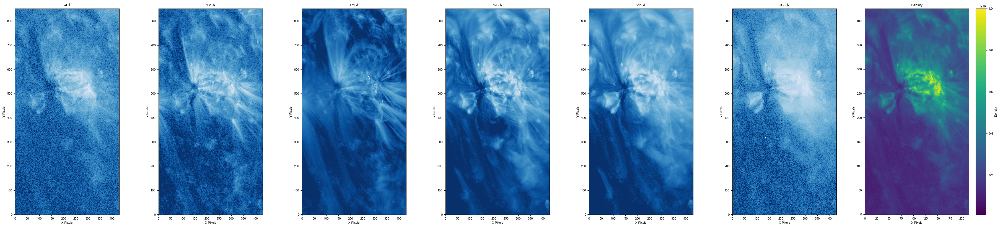

In [213]:
import matplotlib.pyplot as plt

def plot_image_array_and_density(image_array, density):
    """
    Plot each dimension of image_array, as well as the density in a single big plot.

    Parameters:
    image_array (numpy.ndarray): The image array to be plotted.
    density (numpy.ndarray): The density array to be plotted.
    """
    num_images = image_array.shape[2]
    fig, axes = plt.subplots(1, num_images + 1, figsize=(8 * (num_images)*0.76, 8))
    wavelengths = [94, 131, 171, 193, 211, 335]
    # Plot each dimension of image_array
    for i in range(num_images):
        ax = axes[i]
        vmin = np.percentile(image_array[:, :, i], 10)
        vmax = np.percentile(image_array[:, :, i], 100)
        im = ax.imshow(image_array[:, :, i], origin='lower', cmap='Blues_r', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        # fig.colorbar(im, ax=ax, label='Intensity')
        ax.set_title(f'{wavelengths[i]} $\AA$')
        ax.set_xlabel('X Pixels')
        ax.set_ylabel('Y Pixels')
    # Plot the density
    ax = axes[-1]
    im = ax.imshow(density, origin='lower', cmap='viridis', vmin=1e8, vmax=1e10)
    fig.colorbar(im, ax=ax, label='Density')
    ax.set_title('Density')
    ax.set_xlabel('X Pixels')
    ax.set_ylabel('Y Pixels')
    
    plt.tight_layout(pad=-0.1)
    plt.show()

# Example usage
plot_image_array_and_density(image_array, density)


In [198]:
wavelengths

<Quantity [  94.,  131.,  171.,  193.,  211.,  335., 1700.] Angstrom>

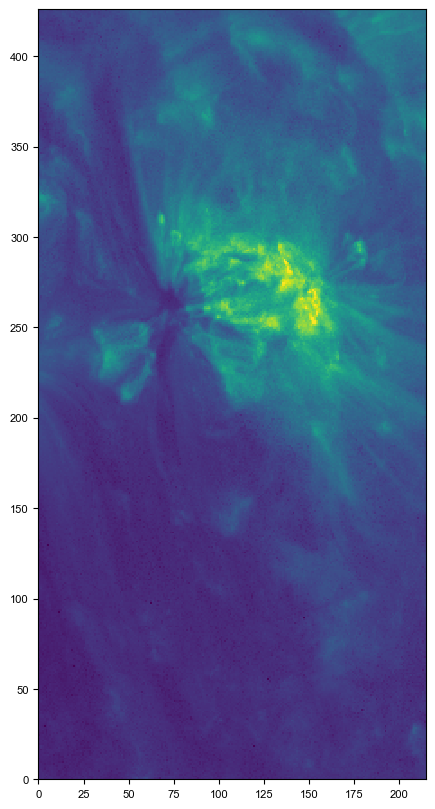

In [187]:
plt.figure(figsize=(5,10))
plt.pcolormesh(density,vmin=1e8, vmax=1e10)

In [172]:
plot_dem_images(aligned_eis,rebinned_results[0],rebinned_results[6],'./rebinned_dem_images.png')

In [143]:
import astropy.time as time
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def plot_dem_images(submap,dem,logtemps,img_arr_tit):
    # submap is only for the date
    ysize,xsize,_c=dem.shape
    
    nt=len(dem[0,0,:])
    nt_new=int(nt/2)
    nc, nr = 3, 3
    plt.rcParams.update({'font.size': 12,'font.family':"sans-serif",\
                         'font.sans-serif':"Arial",'mathtext.default':"regular"})
    figsize = (12 * xsize / ysize * 1.4, 12)  # Adjust width based on aspect ratio, keep height at 12
    fig, axes = plt.subplots(nrows=nr, ncols=nc, figsize=figsize, sharex=True, sharey=True)
    fig.suptitle('Image time = '+time.Time.strftime(submap.date, "%Y-%m-%dT%H:%M:%S"))
    fig.supxlabel('Pixels')
    fig.supylabel('Pixels')
    cmap = plt.colormaps['viridis']

    for i, axi in enumerate(axes.flat):
        i = i+2
        new_dem=(dem[:,:,i*2]+dem[:,:,i*2+1])/2.
        im = axi.imshow(new_dem,vmin=1e21,vmax=1e22,origin='lower',cmap=cmap,aspect='auto')
        axi.set_title('{0:.2f} - {1:.2f}'.format(logtemps[i*2],logtemps[i*2+1+1]))

    plt.tight_layout()
    plt.colorbar(im, ax=axes.ravel().tolist(),label='$\mathrm{DEM\;[cm^{-5}\;K^{-1}]}$',fraction=0.03, pad=0.02)
    plt.savefig(img_arr_tit, bbox_inches='tight')
    plt.close(fig)
    return


Reading csv

In [15]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('/Users/andysh.to/Downloads/EIS Flares Project/downloaded_flare_data.csv')

# Function to get the flare class prefix
def get_flare_class(flare_str):
    return flare_str[0]

# Add a new column with just the flare class prefix
df['Flare Class'] = df['GOES class'].apply(get_flare_class)

# Count the number of flares for each class
flare_counts = df['Flare Class'].value_counts()

# Display the counts for B, C, M, and X class flares
print("Number of flares by class:")
print("B-class:", flare_counts.get('B', 0))
print("C-class:", flare_counts.get('C', 0))
print("M-class:", flare_counts.get('M', 0))
print("X-class:", flare_counts.get('X', 0))

# Display the total number of flares
print("\nTotal number of flares:", len(df))

# Display the first few rows of the dataframe
print("\nFirst few rows of the dataframe:")
print(df.head())

# Get information about the dataframe, including column names and data types
print("\nDataframe information:")
print(df.info())


Number of flares by class:
B-class: 213
C-class: 177
M-class: 19
X-class: 0

Total number of flares: 410

First few rows of the dataframe:
   study ID          flare times GOES class       hpc x       hpc y  \
0       388  2011-01-27 09:55:40       M1.3  938.224556  464.837915   
1       388  2011-01-27 09:55:40       C1.2  941.072224  236.167214   
2       388  2011-01-27 09:55:40       B1.9  941.156268  270.971460   
3       437  2011-01-22 09:47:14       B3.7  184.832068  368.737350   
4       437  2011-01-21 09:26:07       B4.5  -44.362795  388.491765   

     EIS xcen    EIS ycen    EIS fovx  EIS fovy         target  ...  \
0  870.270020  359.550995  299.519989     512.0  Active Region  ...   
1  870.270020  359.550995  299.519989     512.0  Active Region  ...   
2  870.270020  359.550995  299.519989     512.0  Active Region  ...   
3  160.328003  426.216003  239.615997     512.0  Active Region  ...   
4 -119.848999  475.345001  239.615997     512.0  Active Region  ...   

  Full 

In [ ]:
aia_fexviii = aia_maps[94].data - aia_maps[211].data/120 - aia_maps[171].data/450

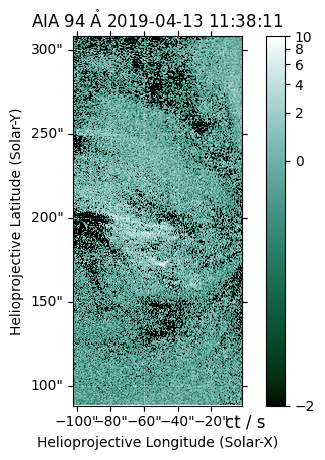

In [ ]:
sunpy.map.Map(aia_fexviii, aia_maps[94].meta).peek(vmin=-2,vmax=10)

In [7]:
from aia_dem_prep import get_aia_dem_prep
from aia_dem import DEMCalculator

In [8]:
save_dir = '/Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps'

image_array, error_array, saved_aia_maps = get_aia_dem_prep(width_map, save_dir)
calculator = DEMCalculator()

dem, edem, elogt, chisq, dn_reg, meanlogt, logtemps_edge = calculator.calculate_dem(image_array,error_array)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 94.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 131.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 171.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 193.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 211.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
PSF dictionary found for wavelength 335.0
INFO: cupy not installed or working, falling back to CPU [aiapy.psf.deconvolve]
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
Prepped!


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Prepping...
Prepped!
Submap coordinates calculated with 10% buffer.
All maps have been submap'ed to the same region.
Map for 94A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_94A.fits
Map for 131A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_131A.fits
Map for 171A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_171A.fits
Map for 193A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_193A.fits
Map for 211A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_211A.fits
Map for 335A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_335A.fits
Map for 1700A saved to /Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/aia_map_1700A.fits
Map for hmiA sa

Calculating DEM: 100%|██████████| 81760/81760 [02:34<00:00, 530.15pixel/s, Pixel=(364,223), Chi^2=5.32]  


In [10]:
plot_dem_images(width_map,dem,logtemps_edge,'/Users/andysh.to/Script/Data/IRIS_output/20190413_113910/20190413_113910/saved_maps/dem_images.png')

NameError: name 'plot_dem_images' is not defined

In [11]:
saved_aia_maps['193'].data

array([[207.70434862, 190.0015112 , 276.57285489, ..., 451.13176094,
        455.61052012, 441.43716028],
       [201.00376669, 191.79354621, 282.300973  , ..., 417.41293416,
        446.63128165, 467.2264044 ],
       [192.83761734, 201.33341187, 184.99970468, ..., 431.13288927,
        461.94656352, 459.57573065],
       ...,
       [511.78527293, 509.62676348, 541.31434325, ..., 436.89725986,
        427.93646591, 421.93322173],
       [501.09236788, 521.1577901 , 580.02355992, ..., 406.98955036,
        421.8198998 , 434.41385385],
       [579.60847199, 543.60147311, 512.25122063, ..., 411.83091679,
        396.69738265, 399.58167112]], dtype='>f8')

In [ ]:
def get_moss(saved_aia_maps):
    1700_data = saved_aia_maps['1700'].data
    # Create a binary mask where 1700 data > 1500 is 1, otherwise 0
    mask_1700 = (saved_aia_maps['1700'].data > 1500).astype(int)
    bright_fexviii = saved_aia_maps['94'].data - saved_aia_maps['211'].data/120 - saved_aia_maps['171'].data/450

Observatory,SDO
Instrument,HMI FRONT2
Detector,HMI
Measurement,magnetogram
Wavelength,6173.0
Observation Date,2019-04-13 11:38:01
Exposure Time,Unknown
Dimension,[224. 365.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[ 209.5 -133.5] pix

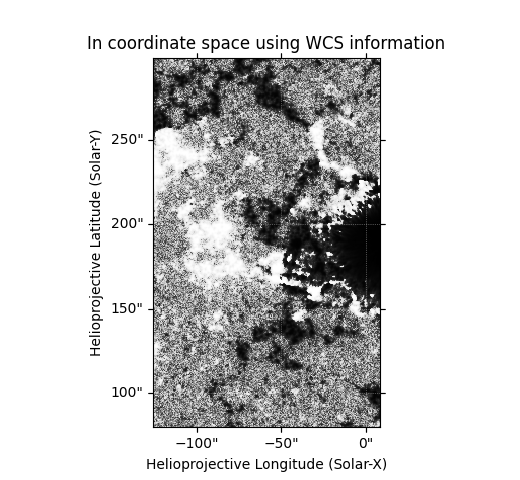
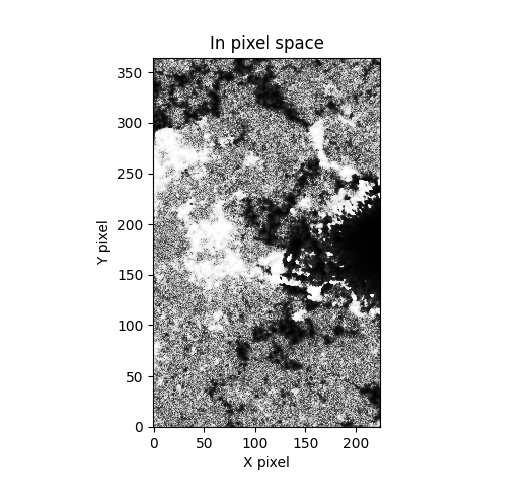
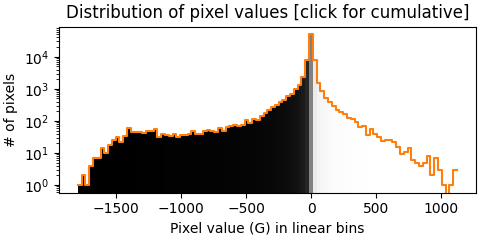
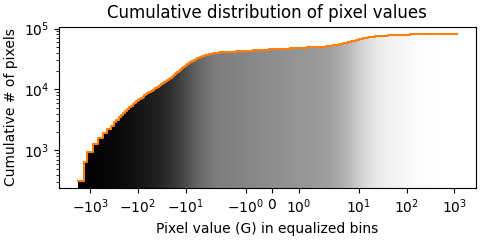

In [13]:
saved_aia_maps['hmi']

In [14]:
import matplotlib.pyplot as plt

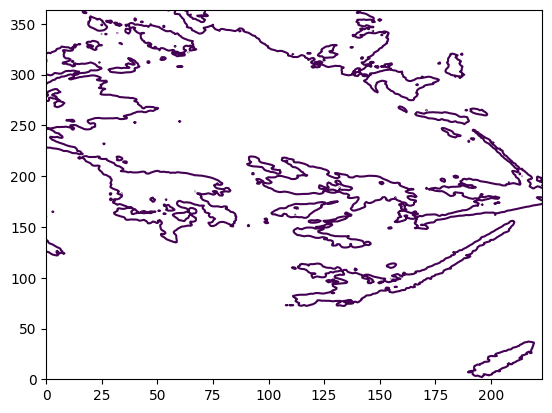

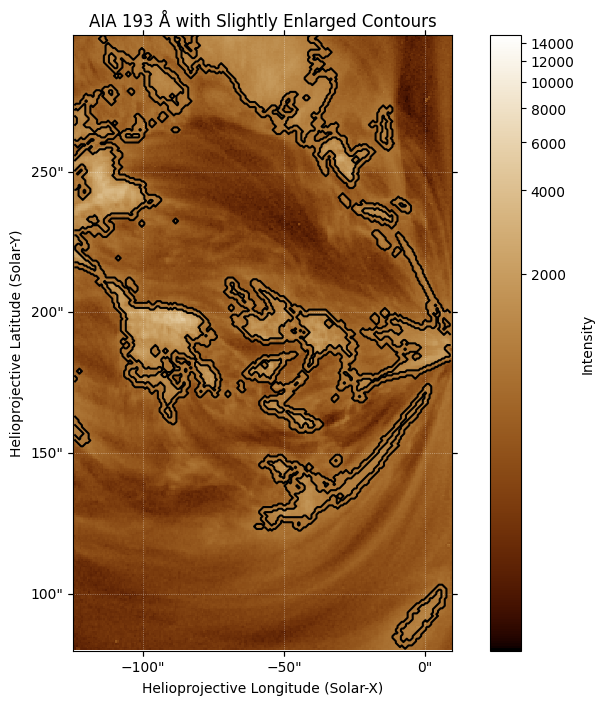

In [34]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

# Set the contour level
contour_level = 1000

# Create the initial contour
contours = plt.contour(saved_aia_maps['193'].data, levels=[contour_level])

# Convert contours to a binary mask
mask = np.zeros(saved_aia_maps['193'].data.shape, dtype=bool)
for path in contours.collections[0].get_paths():
    vertices = path.vertices
    x, y = vertices[:, 0], vertices[:, 1]
    mask[np.round(y).astype(int), np.round(x).astype(int)] = True

# Dilate the mask to enlarge the contour radially, but less than before
enlarged_mask = ndimage.binary_dilation(mask, iterations=1, structure=np.array([[0,1,0],[1,1,1],[0,1,0]]))

# Plot the results
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(projection=saved_aia_maps['193'])

# Plot the original image
saved_aia_maps['193'].plot(axes=ax, vmin=100, vmax=15000)

# Plot the enlarged contour
ax.contour(enlarged_mask, colors='black', linewidths=1.5)

plt.title('AIA 193 Å with Slightly Enlarged Contours')
plt.colorbar(label='Intensity')
plt.show()

# The enlarged_mask can now be used for further processing


In [ ]:
aia_fexviii = saved_aia_maps['94'].data - saved_aia_maps['211'].data/120 - saved_aia_maps['171'].data/450

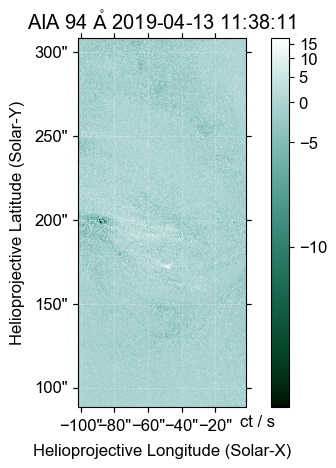

In [ ]:
sunpy.map.Map(aia_fexviii, saved_aia_maps['94'].meta).peek()